### . Import Packages
We'll make use of the following packages:

numpy and pandas is what we'll use to manipulate our data
matplotlib.pyplot and seaborn will be used to produce plots for visualization
util will provide the locally defined utility functions that have been provided for this assignment
We will also use several modules from the keras framework for building deep learning models.

Run the next cell to import all the necessary packages.

In [103]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from tqdm import tqdm
from glob import glob
import os
sns.set()

### Each image in the data set contains multiple text-mined labels identifying 14 different pathological conditions.
These in turn can be used by physicians to diagnose 8 different diseases.
We will use this data to develop a single model that will provide binary classification predictions for each of the 14 labeled pathologies.
In other words it will predict 'positive' or 'negative' for each of the pathologies.
This dataset has been annotated by consensus among four different radiologists for 5 of our 14 pathologies:
Consolidation,
Edema,
Effusion,
Cardiomegaly,
Atelectasis,

In [130]:
# Load the labels
data_csv = pd.read_csv('C:/Users/antuh/Documents/Apu_Thesis/Code_File/Data/sample_labels.csv')

# see how many observations there are
num_obs = len(data_csv)
print('Number of observations:',num_obs)

data_csv.head(5)

Number of observations: 5606


,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,0.139
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,0.168
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,0.168
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,0.143
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,0.168


In [131]:
data_csv.shape

(5606, 11)

In [132]:
data_csv.describe()

,Follow-up #,Patient ID,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y
count,5606.000000,5606.000000,5606.000000,5606.000000,5606.000000,5606.000000
mean,8.616661,14330.617017,2644.795755,2491.087406,0.155467,0.155467
std,15.565815,8411.477789,347.188754,399.119063,0.016201,0.016201
min,0.000000,13.000000,1362.000000,966.000000,0.115000,0.115000
25%,0.000000,7289.000000,2500.000000,2048.000000,0.143000,0.143000
50%,3.000000,13993.000000,2542.000000,2544.000000,0.143000,0.143000
75%,10.000000,20655.500000,2992.000000,2991.000000,0.168000,0.168000
max,177.000000,30797.000000,3266.000000,3056.000000,0.198800,0.198800


### Image Data Load

In [133]:
# Set the path to your data directory
PATH = os.path.abspath(os.path.join('C:/Users/antuh/Documents/Apu_Thesis/Code_File/Data/sample'))

# Assuming your images are in a subdirectory named 'images'
SOURCE_IMAGES = os.path.join(PATH, "images")

# Create a dictionary of image paths
img_paths = {os.path.basename(x): x for x in glob(os.path.join(SOURCE_IMAGES, "*.png"))}

# Assuming your DataFrame is already loaded, map the 'Image Index' column to the full image paths
data_csv['img_path'] = data_csv['Image Index'].map(img_paths.get)


### Finiding path with Image

In [134]:
print(data_csv[['Image Index', 'img_path']].head())

        Image Index                                           img_path
0  00000013_005.png  C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
1  00000013_026.png  C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
2  00000017_001.png  C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
3  00000030_001.png  C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
4  00000032_001.png  C:\Users\antuh\Documents\Apu_Thesis\Code_File\...


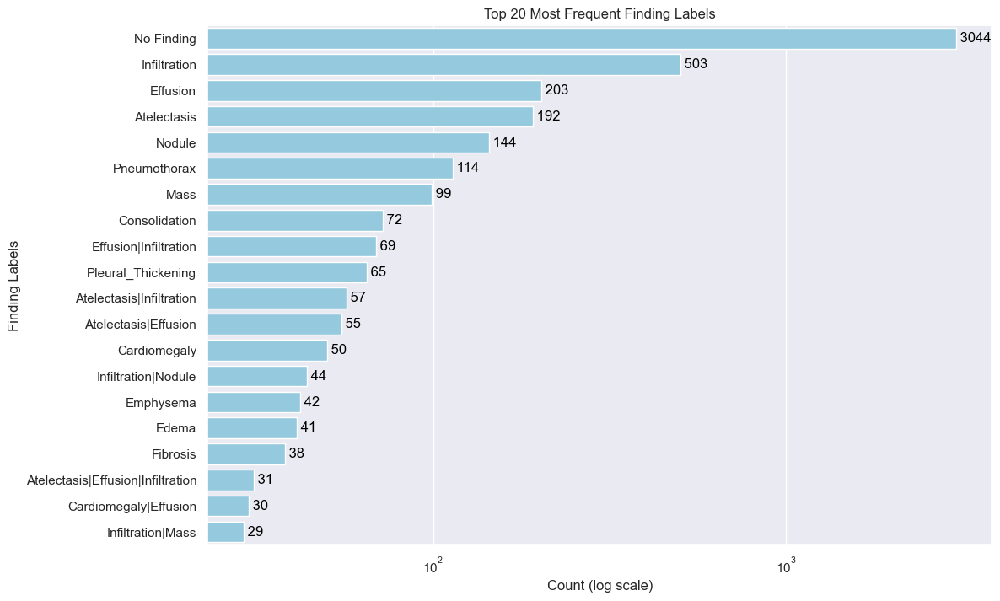

In [110]:
# Get frequency counts per label
count_per_unique_label = data_csv['Finding Labels'].value_counts()

# Convert series to DataFrame for plotting purposes
df_count_per_unique_label = count_per_unique_label.to_frame().reset_index()
df_count_per_unique_label.columns = ['Finding Labels', 'Count']

# Sort DataFrame by count in descending order
df_count_per_unique_label = df_count_per_unique_label.sort_values(by='Count', ascending=False)

# Plot horizontal bar plot
plt.figure(figsize=(12, 8))
barplot = sns.barplot(x='Count', y='Finding Labels', data=df_count_per_unique_label[:20], color="skyblue")

# Use log scale for better visualization on the x-axis
barplot.set(xscale='log')

# Display count values on each bar
for index, value in enumerate(df_count_per_unique_label['Count'][:20]):
    barplot.text(value, index, f' {value}', ha='left', va='center', color='black')

plt.xlabel('Count (log scale)')
plt.ylabel('Finding Labels')
plt.title('Top 20 Most Frequent Finding Labels')
plt.show()



### Diagnosis Distribution (Normal vs Sick)¶
Now lets have a look at the distribution of the dataset. It is quire evident that almost half of the images didn't have any problem. They are simply the x-rays of healthy people marked as No Finding in the data frame. However we can have a look at the number of healthy and non-healthy x-rays.

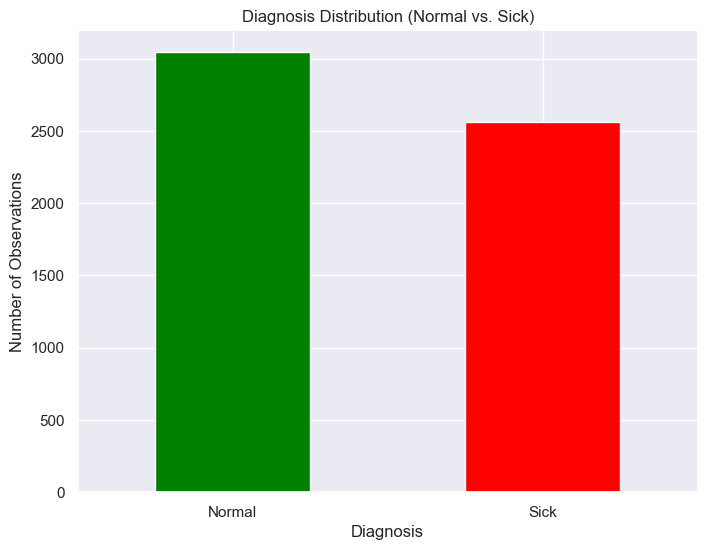

In [5]:
distribution = data_csv['Finding Labels'].apply(lambda x: 'Normal' if 'No Finding' in x else 'Sick')
distribution_counts = distribution.value_counts()

# Plot the distribution
plt.figure(figsize=(8, 6))
distribution_counts.plot(kind='bar', color=['green', 'red'])
plt.title('Diagnosis Distribution (Normal vs. Sick)')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Observations')
plt.xticks(rotation=0)
plt.show()

C:\Users\antuh\AppData\Local\Temp\ipykernel_11644\2033685699.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=diagnosis_counts.values, y=diagnosis_counts.index, palette=colors)


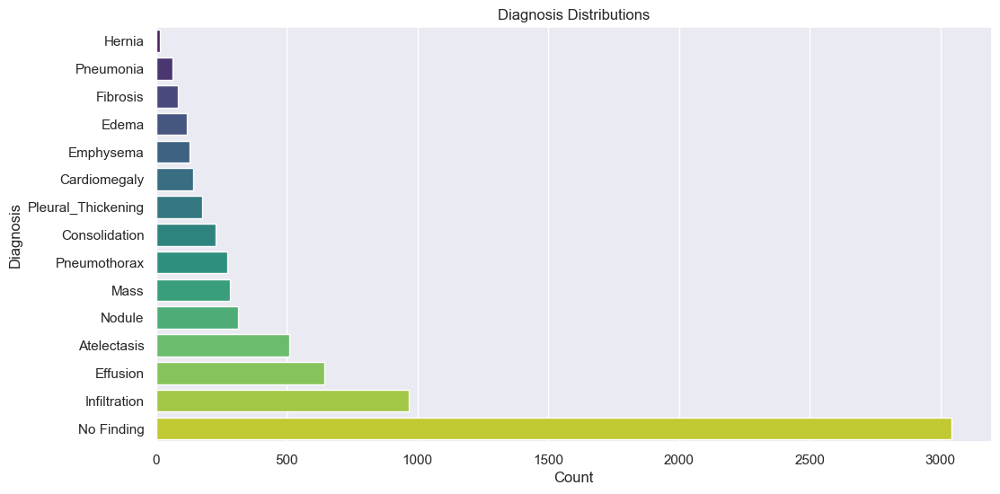

In [10]:
# Split the multiple diagnoses in the "Finding Labels" column
diagnoses = data_csv['Finding Labels'].str.split('|', expand=True).stack().reset_index(level=1, drop=True)

# Count the occurrences of each diagnosis
diagnosis_counts = diagnoses.value_counts().sort_values(ascending=True)

# Create a color map for each finding
colors = sns.color_palette("viridis", n_colors=len(diagnosis_counts))

# Create a horizontal bar plot using Seaborn with different colors for each finding
plt.figure(figsize=(12, 6))
sns.barplot(x=diagnosis_counts.values, y=diagnosis_counts.index, palette=colors)
plt.title("Diagnosis Distributions")
plt.xlabel("Count")
plt.ylabel("Diagnosis")
plt.show()

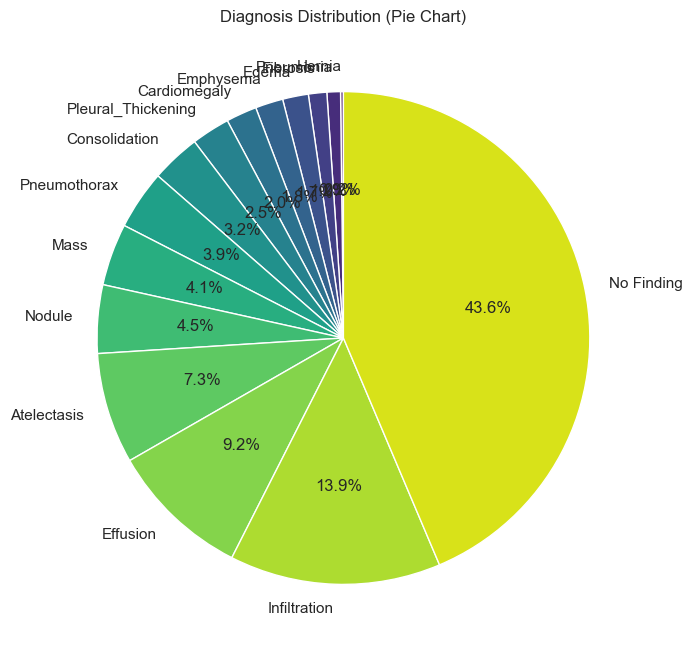

In [11]:
# Split the multiple diagnoses in the "Finding Labels" column
diagnoses = data_csv['Finding Labels'].str.split('|', expand=True).stack().reset_index(level=1, drop=True)

# Count the occurrences of each diagnosis
diagnosis_counts = diagnoses.value_counts().sort_values(ascending=True)

# Create a color map for each finding
colors = sns.color_palette("viridis", n_colors=len(diagnosis_counts))

# Create a pie chart with different colors for each finding
plt.figure(figsize=(8, 8))
plt.pie(diagnosis_counts, labels=diagnosis_counts.index, autopct='%1.1f%%', colors=colors, startangle=90)

plt.title("Diagnosis Distribution (Pie Chart)")
plt.show()

### Age Distribution

count    5603.000000
mean       46.719258
std        16.700885
min         2.000000
25%        35.000000
50%        49.000000
75%        59.000000
max        94.000000
Name: Patient Age, dtype: float64


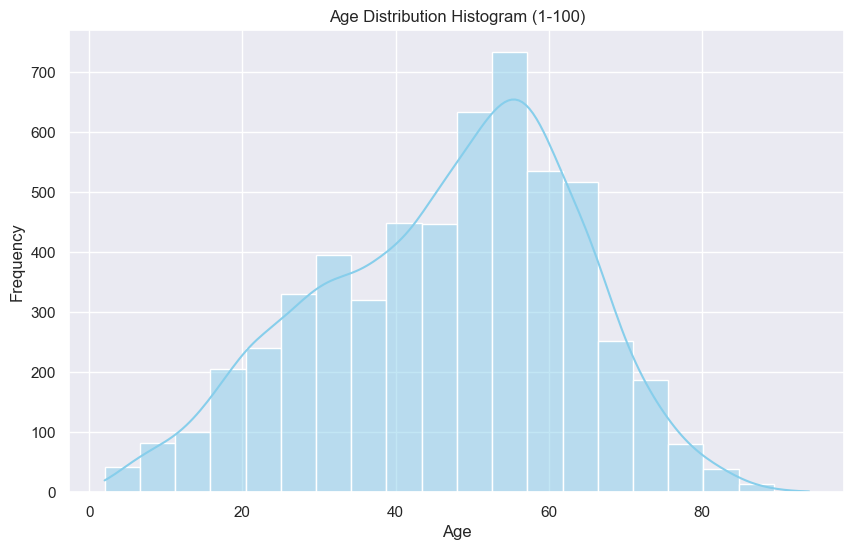

In [114]:
# Convert 'Patient Age' to strings, then remove 'Y' and handle errors
data_csv['Patient Age'] = pd.to_numeric(data_csv['Patient Age'].astype(str).str.rstrip('Y'), errors='coerce')

# Drop rows with missing age values for simplicity (handle missing values based on your requirements)
data_csv = data_csv.dropna(subset=['Patient Age'])

# Filter ages within the range of 1 to 100
filtered_data = data_csv[(data_csv['Patient Age'] >= 1) & (data_csv['Patient Age'] <= 100)]

# Check the basic statistics of age data to identify any outliers
print(filtered_data['Patient Age'].describe())

# Create a histogram of 'Patient Age' within the range of 1 to 100
plt.figure(figsize=(10, 6))
sns.histplot(filtered_data['Patient Age'], bins=20, kde=True, color='skyblue')
plt.title('Age Distribution Histogram (1-100)')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

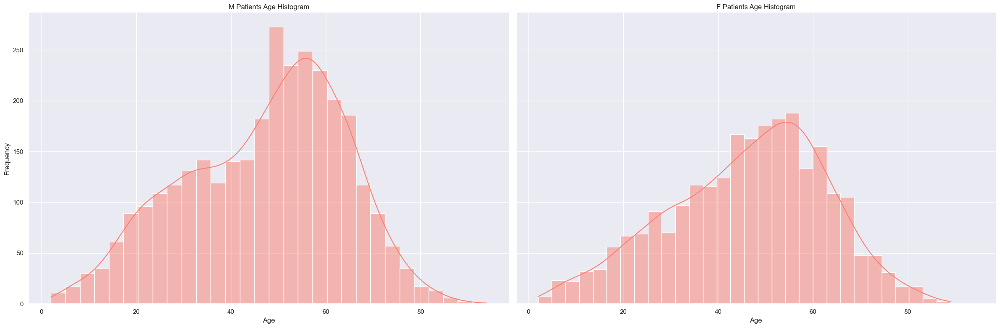

In [116]:
# Convert 'Patient Age' to numeric, removing 'Y' and handling errors
data_csv['Patient Age'] = pd.to_numeric(data_csv['Patient Age'], errors='coerce')

# Drop rows with missing age values for simplicity (handle missing values based on your requirements)
data_csv = data_csv.dropna(subset=['Patient Age'])
# Filter ages within the range of 1 to 100
filtered_data = data_csv[(data_csv['Patient Age'] >= 1) & (data_csv['Patient Age'] <= 100)]

# Separate age data for male and female patients
ages_male = filtered_data.loc[filtered_data["Patient Gender"] == 'M', "Patient Age"]
ages_female = filtered_data.loc[filtered_data["Patient Gender"] == 'F', "Patient Age"]

# Set up Seaborn FacetGrid for side-by-side histograms
g = sns.FacetGrid(filtered_data, col="Patient Gender", height=8, aspect=1.5)
g.map(sns.histplot, "Patient Age", bins=30, kde=True, color='salmon')

# Set titles and labels
g.set_titles("{col_name} Patients Age Histogram")
g.set_axis_labels("Age", "Frequency")

plt.show()

In [111]:
classes = ['Atelectasis',
                'Consolidation',
                'Infiltration', 
                'Pneumothorax', 
                'Edema', 
                'Emphysema',
                'Fibrosis', 
                'Effusion', 
                'Pneumonia',
                'Pleural_Thickening',
                'Cardiomegaly',
                'Nodule', 
                'Mass', 
                'Hernia'] # taken from paper

# One Hot Encoding of Finding Labels to classes
for label in classes:
    data_csv[label] = data_csv['Finding Labels'].map(lambda result: 1.0 if label in result else 0)
data_csv.head(5) # check the data, looking good!

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,...,Edema,Emphysema,Fibrosis,Effusion,Pneumonia,Pleural_Thickening,Cardiomegaly,Nodule,Mass,Hernia
0,00000013_005.png,Emphysema|Infiltration|Pleural_Thickening|Pneu...,5,13,060Y,M,AP,3056,2544,0.139,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,00000013_026.png,Cardiomegaly|Emphysema,26,13,057Y,M,AP,2500,2048,0.168,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,00000017_001.png,No Finding,1,17,077Y,M,AP,2500,2048,0.168,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00000030_001.png,Atelectasis,1,30,079Y,M,PA,2992,2991,0.143,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00000032_001.png,Cardiomegaly|Edema|Effusion,1,32,055Y,F,AP,2500,2048,0.168,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0


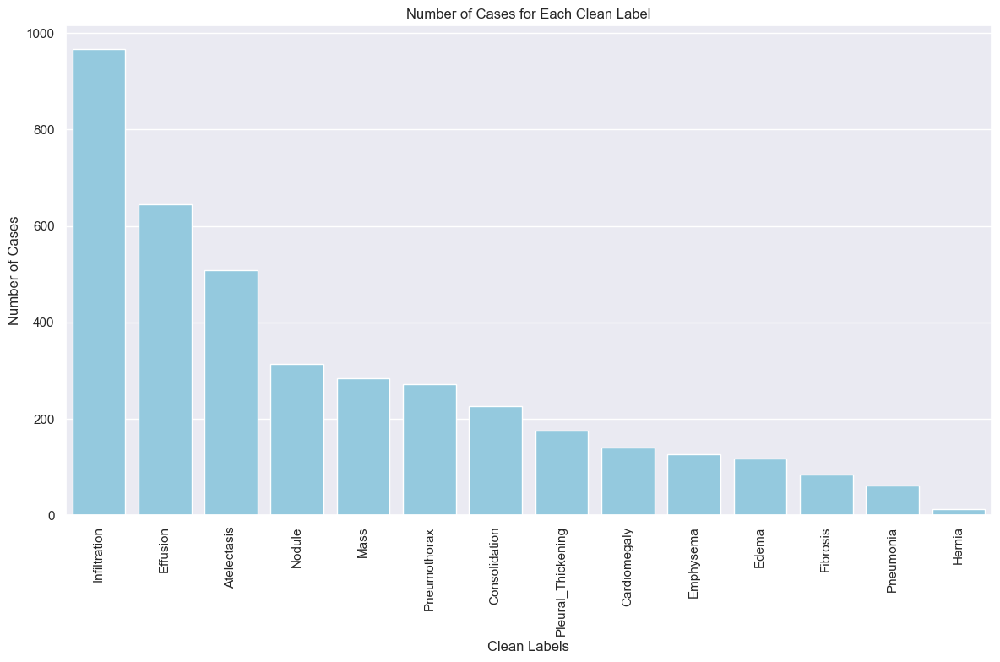

In [112]:
clean_labels = data_csv[classes].sum().sort_values(ascending=False)

# plot cases using seaborn barchart with sky blue color
clean_labels_df = clean_labels.to_frame().reset_index()  # convert to dataframe for plotting purposes
plt.figure(figsize=(12, 8))
sns.barplot(x=clean_labels_df['index'], y=0, data=clean_labels_df, color="skyblue")
plt.xticks(rotation=90)
plt.xlabel('Clean Labels')
plt.ylabel('Number of Cases')
plt.title('Number of Cases for Each Clean Label')
plt.tight_layout()
plt.show()

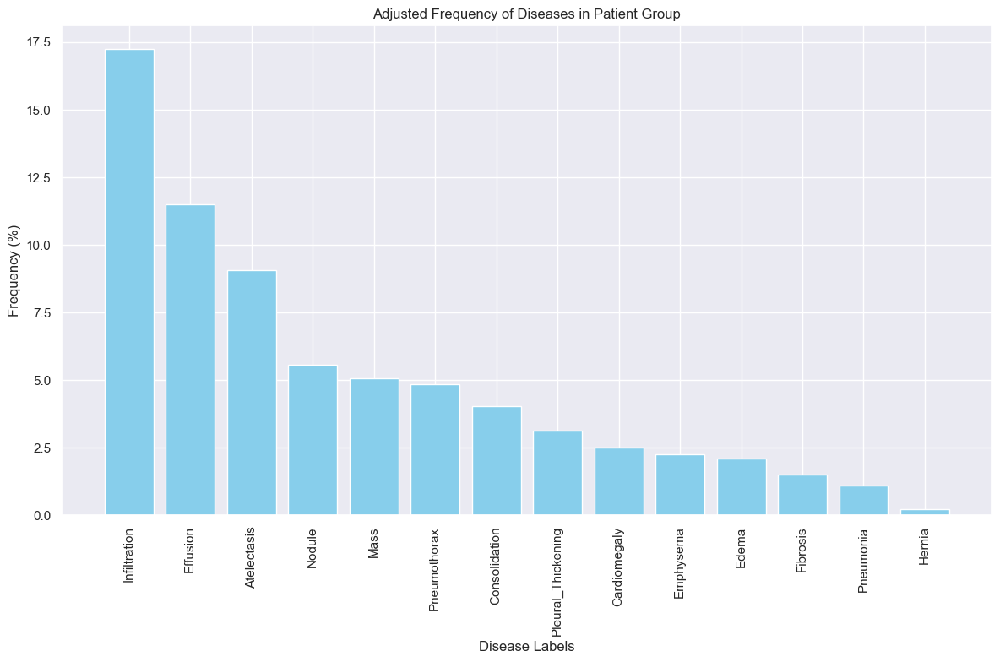

In [113]:
# Assuming 'clean_labels' is a list of your clean labels
clean_labels = data_csv[classes].sum().sort_values(ascending=False)  # get sorted value_count for clean labels

# Convert 'clean_labels' to a list of column names
clean_labels_columns = clean_labels.index.tolist()

# Calculate label counts
label_counts = 100 * np.mean(data_csv[clean_labels_columns].values, 0)

# Plot the bar chart
fig, ax1 = plt.subplots(1, 1, figsize=(12, 8))
ax1.bar(np.arange(len(label_counts)) + 0.5, label_counts, color="skyblue")
ax1.set_xticks(np.arange(len(label_counts)) + 0.5)
ax1.set_xticklabels(clean_labels_columns, rotation=90)
ax1.set_title('Adjusted Frequency of Diseases in Patient Group')
ax1.set_ylabel('Frequency (%)')
ax1.set_xlabel('Disease Labels')
plt.tight_layout()
plt.show()


### No. of each disease by patient gender

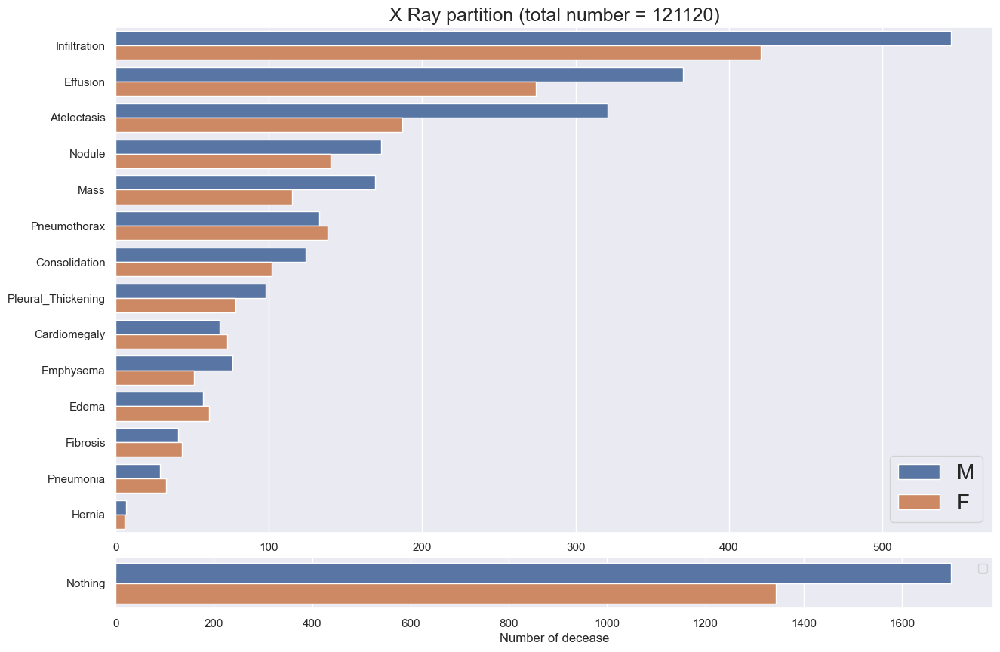

In [119]:
import matplotlib.gridspec as gridspec

for pathology in classes:
    data_csv[pathology] = data_csv['Finding Labels'].apply(lambda x: 1 if pathology in x else 0)

plt.figure(figsize=(15,10))
gs = gridspec.GridSpec(8,1)
ax1 = plt.subplot(gs[:7, :])
ax2 = plt.subplot(gs[7, :])
data1 = pd.melt(data_csv,
             id_vars=['Patient Gender'],
             value_vars = list(classes),
             var_name = 'Category',
             value_name = 'Count')
data1 = data1.loc[data1.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data1, ax=ax1, order = data1['Category'].value_counts().index)
ax1.set( ylabel="",xlabel="")
ax1.legend(fontsize=20)
ax1.set_title('X Ray partition (total number = 121120)',fontsize=18);

data_csv['Nothing']=data_csv['Finding Labels'].apply(lambda x: 1 if 'No Finding' in x else 0)

data2 = pd.melt(data_csv,
             id_vars=['Patient Gender'],
             value_vars = list(['Nothing']),
             var_name = 'Category',
             value_name = 'Count')
data2 = data2.loc[data2.Count>0]
g=sns.countplot(y='Category',hue='Patient Gender',data=data2,ax=ax2)
ax2.set( ylabel="",xlabel="Number of decease")
ax2.legend('')
plt.subplots_adjust(hspace=.5)

## Display patient number by Follow-up in details


C:\Users\antuh\AppData\Local\Temp\ipykernel_11644\1493627127.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g1 = sns.countplot(x='Follow-up #', data=df1, palette="GnBu_d", ax=ax1)
C:\Users\antuh\AppData\Local\Temp\ipykernel_11644\1493627127.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  g2 = sns.countplot(x='Follow-up #', data=df2, palette="GnBu_d", ax=ax2)


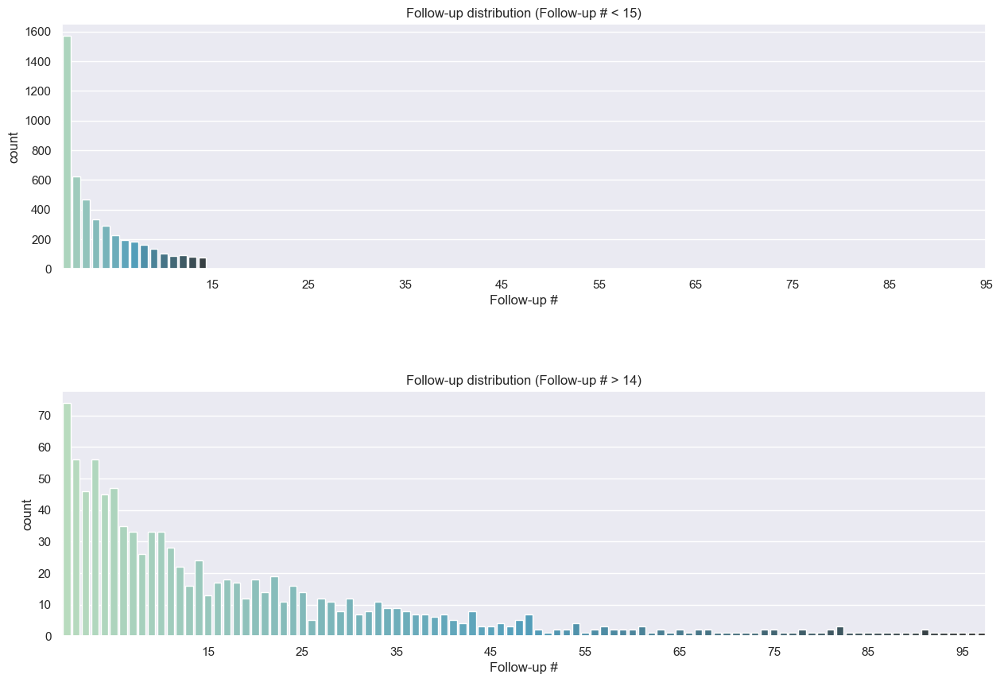

In [60]:

f, (ax1, ax2) = plt.subplots(2, figsize=(15, 10))

# First subplot
df1 = data_csv[data_csv['Follow-up #'] < 15]
g1 = sns.countplot(x='Follow-up #', data=df1, palette="GnBu_d", ax=ax1)
ax1.set_title('Follow-up distribution (Follow-up # < 15)')

# Second subplot
df2 = data_csv[data_csv['Follow-up #'] > 14]
g2 = sns.countplot(x='Follow-up #', data=df2, palette="GnBu_d", ax=ax2)
ax2.set_title('Follow-up distribution (Follow-up # > 14)')

# Set common x-axis labels
x_ticks = np.arange(15, 100, 10)
ax1.set_xticks(x_ticks)
ax1.set_xticklabels(x_ticks)
ax2.set_xticks(x_ticks)
ax2.set_xticklabels(x_ticks)

# Adjust layout
f.subplots_adjust(hspace=0.5)

plt.show()

## Ratio Between One and Multiple Disease

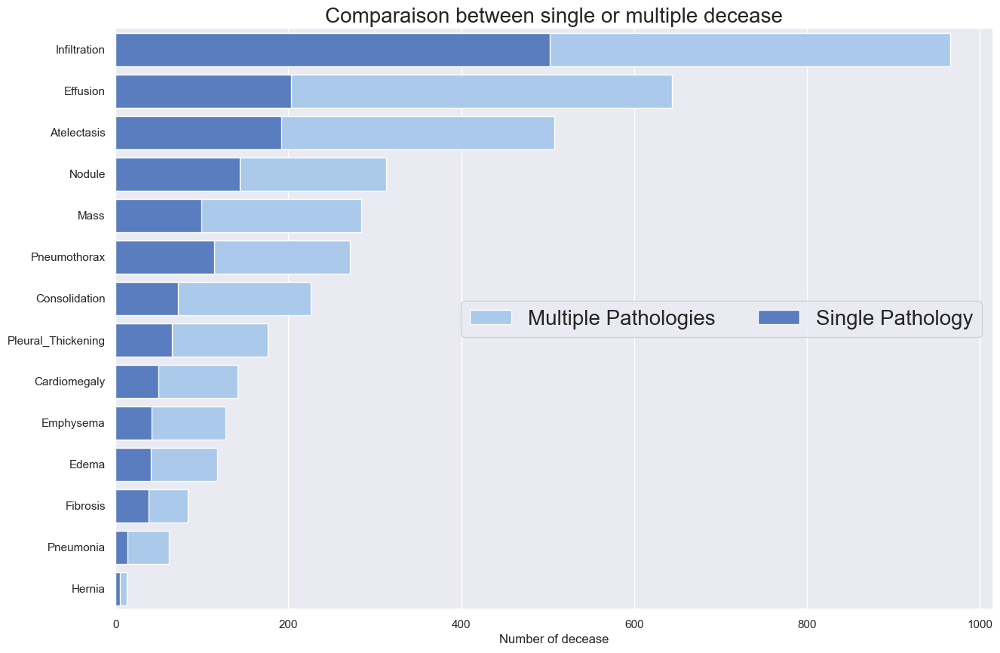

In [121]:
df=data_csv.groupby('Finding Labels').count().sort_values('Patient ID',ascending=False)
df1=df[['|' in index for index in df.index]].copy()
df2=df[['|' not in index for index in df.index]]
df2=df2[['No Finding' not in index for index in df2.index]]
df2['Finding Labels']=df2.index.values
df1['Finding Labels']=df1.index.values
f, ax = plt.subplots(sharex=True,figsize=(15, 10))
sns.set_color_codes("pastel")
g=sns.countplot(y='Category',data=data1, ax=ax, order = data1['Category'].value_counts().index,color='b',label="Multiple Pathologies")
sns.set_color_codes("muted")
g=sns.barplot(x='Patient ID',y='Finding Labels',data=df2, ax=ax, color="b",label="Single Pathology")
ax.legend(ncol=2, loc="center right", frameon=True,fontsize=20)
ax.set( ylabel="",xlabel="Number of decease")
ax.set_title("Comparaison between single or multiple decease",fontsize=20)      
sns.despine(left=True)


### Seleting some samples from all the images¶


100%|██████████| 14/14 [00:01<00:00,  7.04it/s]


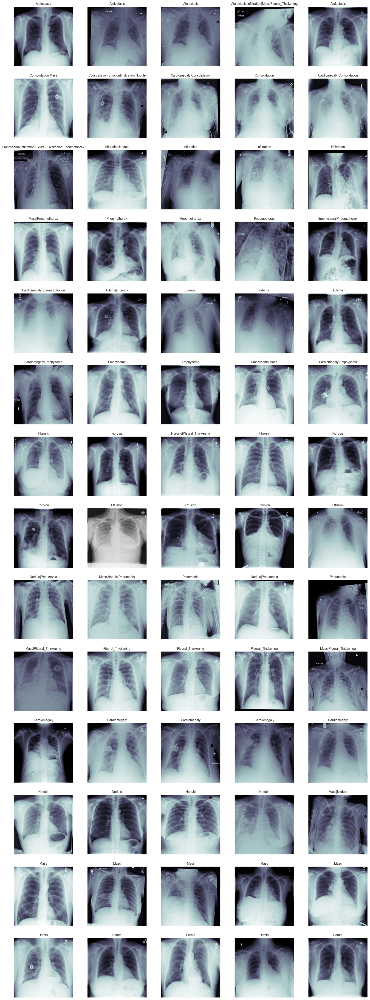

In [29]:
n_row = 14
n_col = 5
MAX_IMAGES_PER_LABEL = 5  # Adjust this value as needed

fig, ax = plt.subplots(n_row, n_col, figsize=(n_col * 4, n_row * 4))

for row in tqdm(range(n_row)):

    data = data_csv[data_csv.labels == row].head(MAX_IMAGES_PER_LABEL)  # Limit to a fixed number of images

    for col in range(n_col):
        idx = col
        if idx < len(data):
            ax[row][col].imshow(plt.imread(data['full_path'].iloc[idx]), cmap='bone')
            ax[row][col].set_xticks([])
            ax[row][col].set_yticks([])
            title = data['Finding Labels'].iloc[idx]
            ax[row][col].set_title(f'{title}', fontsize=10)
        else:
            # If the number of images for a label is less than MAX_IMAGES_PER_LABEL, leave the subplot blank
            ax[row][col].axis('off')

plt.show()


### Data Set Preprocessing

<Axes: >

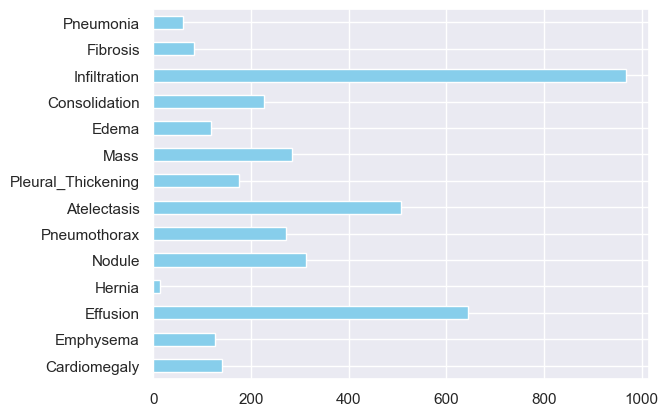

In [18]:
data_csv = data_csv.drop(['No Findings'],axis = 1)
data_csv.iloc[:,1:].sum().plot.barh(color='skyblue')

<Axes: >

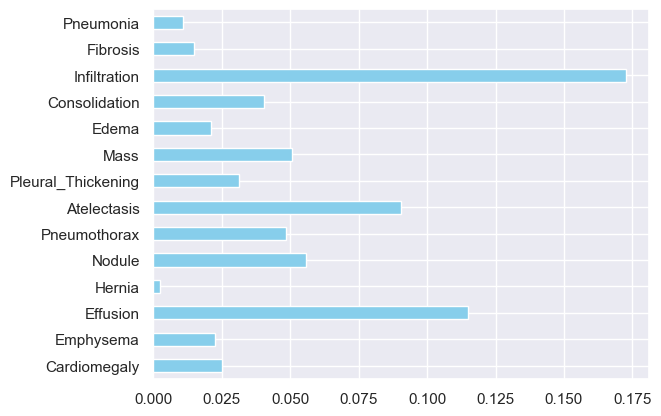

In [19]:
data_csv.iloc[:,1:].mean().plot.barh(color='skyblue')

In [10]:
data_csv.isnull().sum()

Image Index                       0
Finding Labels                    0
Follow-up #                       0
Patient ID                        0
Patient Age                       0
Patient Gender                    0
View Position                     0
OriginalImageWidth                0
OriginalImageHeight               0
OriginalImagePixelSpacing_x       0
OriginalImagePixelSpacing_y       0
img_path                       5606
dtype: int64

In [135]:
data_csv.sample(5,random_state=42)

,Image Index,Finding Labels,Follow-up #,Patient ID,Patient Age,Patient Gender,View Position,OriginalImageWidth,OriginalImageHeight,OriginalImagePixelSpacing_x,OriginalImagePixelSpacing_y,img_path
2146,00011065_007.png,No Finding,7,11065,066Y,M,PA,2992,2991,0.143,0.143,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
1879,00009892_001.png,No Finding,1,9892,062Y,F,PA,2992,2991,0.143,0.143,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
346,00001836_076.png,Mass|Nodule,76,1836,050Y,F,AP,2500,2048,0.168,0.168,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
2240,00011520_002.png,No Finding,2,11520,049Y,M,AP,2500,2048,0.168,0.168,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...
1419,00007354_020.png,Consolidation|Mass,20,7354,043Y,M,AP,2500,2048,0.168,0.168,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...


In [136]:
data_csv=data_csv[['Finding Labels','Patient ID','img_path']]

In [138]:
labels=data_csv['Finding Labels'].str.split('|',expand=True).stack().unique()
for l in labels:
    data_csv[l]=data_csv['Finding Labels'].map(lambda x:1 if l in x else 0)

In [139]:
data_csv.sample(5,random_state=42)

,Finding Labels,Patient ID,img_path,Emphysema,Infiltration,Pleural_Thickening,Pneumothorax,Cardiomegaly,No Finding,Atelectasis,Edema,Effusion,Consolidation,Mass,Nodule,Fibrosis,Pneumonia,Hernia
2146,No Finding,11065,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1879,No Finding,9892,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
346,Mass|Nodule,1836,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0
2240,No Finding,11520,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
1419,Consolidation|Mass,7354,C:\Users\antuh\Documents\Apu_Thesis\Code_File\...,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0


In [140]:
data_csv.drop(columns=['Patient ID','img_path','Finding Labels']).sum()/len(data_csv)

Emphysema             0.022654
Infiltration          0.172494
Pleural_Thickening    0.031395
Pneumothorax          0.048341
Cardiomegaly          0.025152
No Finding            0.542990
Atelectasis           0.090617
Edema                 0.021049
Effusion              0.114877
Consolidation         0.040314
Mass                  0.050660
Nodule                0.055833
Fibrosis              0.014984
Pneumonia             0.011060
Hernia                0.002319
dtype: float64

### Spilt Data Set

In [141]:
rand_gen=np.random.RandomState(42)

In [142]:
ids=set(data_csv['Patient ID'].unique().flatten())
train_ids=set(rand_gen.choice(data_csv['Patient ID'].unique(),int(len(data_csv['Patient ID'].unique())*0.7),replace=False).flatten())
val_ids=ids-train_ids
test_ids=set(rand_gen.choice(list(val_ids),int(len(val_ids)*0.4),replace=False))
val_ids=val_ids-test_ids

In [143]:
val=data_csv[data_csv['Patient ID'].isin(val_ids)]
test=data_csv[data_csv['Patient ID'].isin(test_ids)]
train=data_csv[data_csv['Patient ID'].isin(train_ids)]

In [144]:
train.reset_index(inplace=True,drop=True)
val.reset_index(inplace=True,drop=True)
test.reset_index(inplace=True,drop=True)

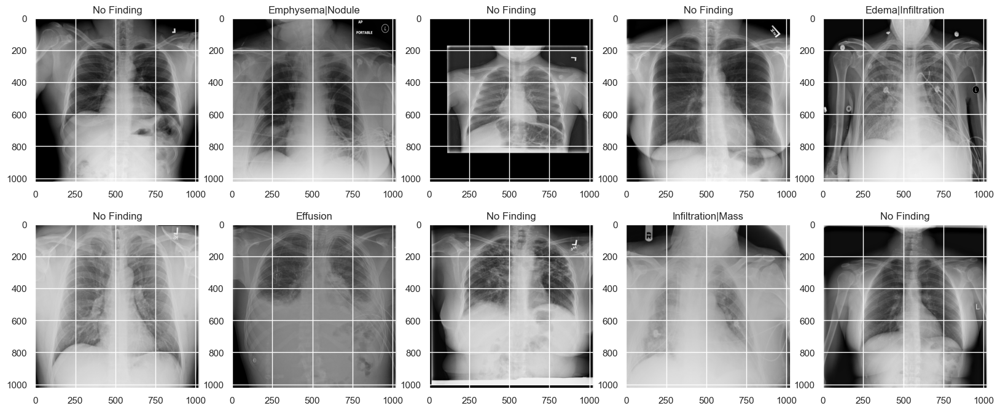

In [145]:
import cv2
inx=np.random.randint(0,len(train),10)
f,ax=plt.subplots(2,5,figsize=(20,8))
ax=ax.flatten()
for i,j in enumerate(inx):
    ax[i].imshow(cv2.imread(train.loc[j]['img_path']))
    ax[i].set_title(train.loc[j]['Finding Labels'])

In [146]:
train.drop(columns=['Finding Labels'],inplace=True)
val.drop(columns=['Finding Labels'],inplace=True)
test.drop(columns=['Finding Labels'],inplace=True)

C:\Users\antuh\AppData\Local\Temp\ipykernel_12964\3613077286.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.drop(columns=['Finding Labels'],inplace=True)
C:\Users\antuh\AppData\Local\Temp\ipykernel_12964\3613077286.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val.drop(columns=['Finding Labels'],inplace=True)
C:\Users\antuh\AppData\Local\Temp\ipykernel_12964\3613077286.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [29]:
from keras.preprocessing.image import ImageDataGenerator
def img_dataset(df_inp,path,targets,aug_args,shuff=True):
    
    img_gen=ImageDataGenerator(rescale=1./255,**aug_args)
    df_gen = img_gen.flow_from_dataframe(dataframe=df_inp,
                                     x_col=path,
                                     y_col=targets,
                                     class_mode="raw",
                                     batch_size=8,
                                         seed=42,
                                         shuffle=shuff,
                                     target_size=(256,256))
    return df_gen

In [30]:
augm_args=dict(rotation_range=0.15,
                            width_shift_range=0.05,
                            height_shift_range=0.05,
                            shear_range=0.05,
                            zoom_range=0.05,
                            fill_mode='nearest')


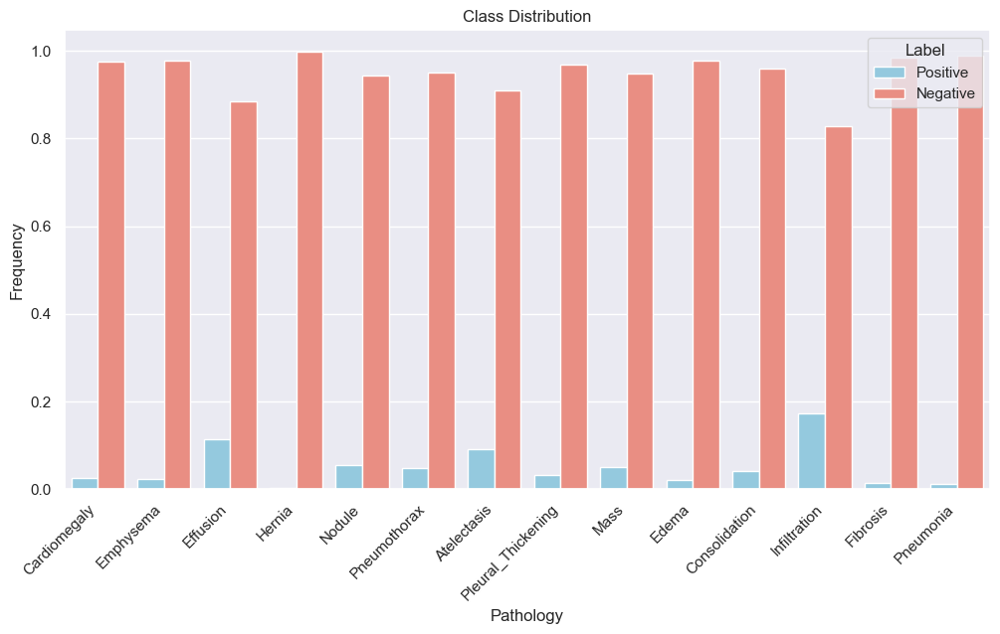

In [20]:
import seaborn as sns
import matplotlib.pyplot as plt
def compute_class_freqs(labels):
    labels = np.array(labels)
    N = labels.shape[0]
    positive_frequencies = np.sum(labels, axis=0) / N
    negative_frequencies = 1 - positive_frequencies
    return positive_frequencies, negative_frequencies
# Assuming 'labels' and 'pathology_list' are defined in your environment
freq_pos, freq_neg = compute_class_freqs(data_csv.iloc[:, 1:])

df_pos = pd.DataFrame({"Class": pathology_list, "Label": "Positive", "Value": freq_pos})
df_neg = pd.DataFrame({"Class": pathology_list, "Label": "Negative", "Value": freq_neg})

df = pd.concat([df_pos, df_neg], ignore_index=True)

# Define custom colors for Positive and Negative bars
positive_color = 'skyblue'
negative_color = 'salmon'

# Plot the bar chart with custom colors
plt.figure(figsize=(12, 6))
plt.xticks(rotation=45, ha='right')
sns.barplot(x="Class", y="Value", hue="Label", data=df, palette={"Positive": positive_color, "Negative": negative_color})
plt.title('Class Distribution')
plt.xlabel('Pathology')
plt.ylabel('Frequency')
plt.show()

In [34]:
pos_frq=np.array(train.drop(columns=['Patient ID','img_path']).sum(axis=0))/len(train)
neg_frq=1-pos_frq
pos_weights = neg_frq
neg_weights = pos_frq
pos_contribution = pos_frq * pos_weights 
neg_contribution = neg_frq * neg_weights

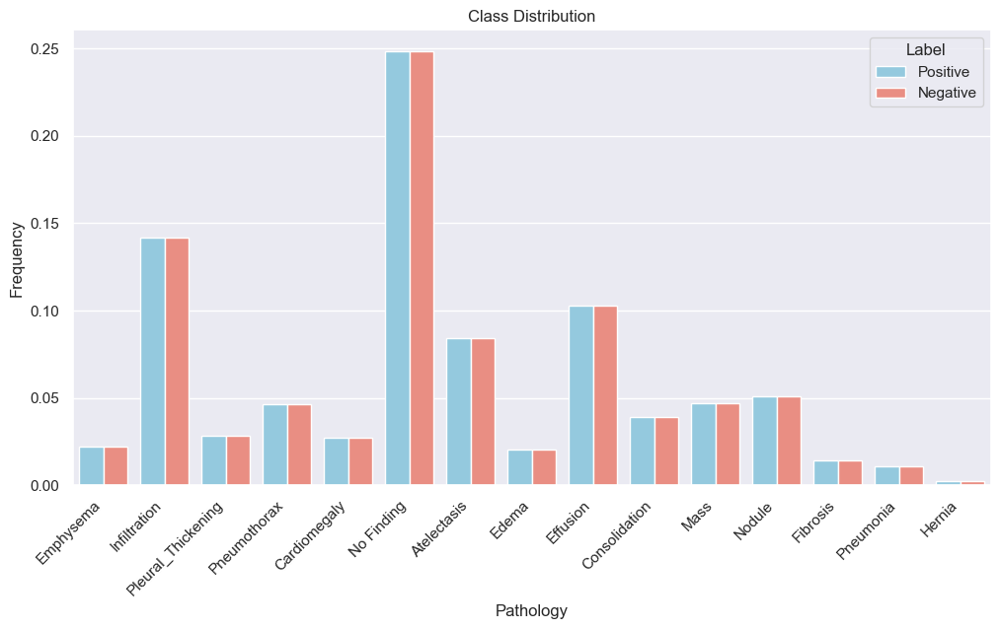

In [40]:
data = pd.concat([
    pd.DataFrame({"Class": train.columns[2:], "Label": "Positive", "Value": pos_contribution}),
    pd.DataFrame({"Class": train.columns[2:], "Label": "Negative", "Value": neg_contribution})
], ignore_index=True)

# Set the color palette for positive and negative bars
colors = {"Positive": "skyblue", "Negative": "salmon"}

# Create the bar plot
plt.figure(figsize=(12, 6))  # Set the figure size here
sns.barplot(x="Class", y="Value", hue="Label", data=data, palette=colors)

# Additional formatting for the overall plot
plt.xticks(rotation=45, ha='right')
plt.title('Class Distribution')
plt.xlabel('Pathology')
plt.ylabel('Frequency')

# Show the plot
plt.show()

In [41]:
def weighted_loss(true,pred):
    loss=0
    true=tf.cast(true, dtype='float32')
    for i in range(len(pos_weights)):
        loss_pos = -1 * K.mean(pos_weights[i] * true[:, i] * K.log(pred[:, i] + 1e-7))
        loss_neg = -1 * K.mean(neg_weights[i] * (1 - true[:, i]) * K.log(1 - pred[:, i] + 1e-7))
        loss += loss_pos + loss_neg
    return loss

In [42]:
train_gen=img_dataset(train,'img_path',train.columns[2:],augm_args,shuff=True)
val_gen=img_dataset(val,'img_path',train.columns[2:],dict(),shuff=False)

Found 3931 validated image filenames.
Found 1006 validated image filenames.


In [98]:
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.metrics import AUC, Precision, Recall, Accuracy
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras import backend as K
import tensorflow as tf
# Assuming 'labels' is a list of your class labels

# Adjusted image size and batch size
image_size = 128
batch_size = 32

# Create DenseNet121 base model
dnet = DenseNet121(
    input_shape=(image_size, image_size, 3),
    weights='imagenet',
    include_top=False
)
dnet.trainable = True

x = dnet.output
x = GlobalAveragePooling2D()(x)
preds = Dense(len(labels), activation="sigmoid")(x)
model = Model(inputs=dnet.input, outputs=preds)
callbacks = [ModelCheckpoint('model_wts', verbose=1, save_best_only=True)]
opt = Adam(learning_rate=1e-4)

# Compile the model
model.compile(
    optimizer=opt, loss=weighted_loss,
    metrics=['accuracy', AUC(), Precision(), Recall()]
)


# Display the summary of the model
model.summary()

# Define a custom callback to print accuracy in percentage format
class PrintAccuracyCallback(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f'Accuracy: {logs["accuracy"] * 100:.2f}%')

history = model.fit_generator(train_gen, 
                              validation_data=val_gen,
                              steps_per_epoch=400, 
                              validation_steps=100, 
                              epochs=5,
                              callbacks=[PrintAccuracyCallback()] + callbacks)


Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 128, 128, 3)]        0         []                            
                                                                                                  
 zero_padding2d_12 (ZeroPad  (None, 134, 134, 3)          0         ['input_7[0][0]']             
 ding2D)                                                                                          
                                                                                                  
 conv1/conv (Conv2D)         (None, 64, 64, 64)           9408      ['zero_padding2d_12[0][0]']   
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 64, 64, 64)           256       ['conv1/conv[0][0]']    

C:\Users\antuh\AppData\Local\Temp\ipykernel_12964\3931975709.py:45: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_gen,


Epoch 1/5



400/400 [==============================] - ETA: 0s - loss: 1.2125 - accuracy: 0.2228 - auc_5: 0.6419 - precision_5: 0.1210 - recall_5: 0.5716Accuracy: 22.28%

Epoch 1: val_loss improved from inf to 1.23916, saving model to model_wts
INFO:tensorflow:Assets written to: model_wts\assets


INFO:tensorflow:Assets written to: model_wts\assets


400/400 [==============================] - 1324s 3s/step - loss: 1.2125 - accuracy: 0.2228 - auc_5: 0.6419 - precision_5: 0.1210 - recall_5: 0.5716 - val_loss: 1.2392 - val_accuracy: 0.3950 - val_auc_5: 0.7762 - val_precision_5: 0.1987 - val_recall_5: 0.6657
Epoch 2/5
400/400 [==============================] - ETA: 0s - loss: 1.0838 - accuracy: 0.3230 - auc_5: 0.7452 - precision_5: 0.1616 - recall_5: 0.6655Accuracy: 32.30%

Epoch 2: val_loss improved from 1.23916 to 1.17232, saving model to model_wts
INFO:tensorflow:Assets written to: model_wts\assets


INFO:tensorflow:Assets written to: model_wts\assets


400/400 [==============================] - 1195s 3s/step - loss: 1.0838 - accuracy: 0.3230 - auc_5: 0.7452 - precision_5: 0.1616 - recall_5: 0.6655 - val_loss: 1.1723 - val_accuracy: 0.2575 - val_auc_5: 0.7473 - val_precision_5: 0.1802 - val_recall_5: 0.6526
Epoch 3/5
400/400 [==============================] - ETA: 0s - loss: 1.0444 - accuracy: 0.3553 - auc_5: 0.7629 - precision_5: 0.1729 - recall_5: 0.6884Accuracy: 35.53%

Epoch 3: val_loss improved from 1.17232 to 1.16023, saving model to model_wts
INFO:tensorflow:Assets written to: model_wts\assets


INFO:tensorflow:Assets written to: model_wts\assets


400/400 [==============================] - 1735s 4s/step - loss: 1.0444 - accuracy: 0.3553 - auc_5: 0.7629 - precision_5: 0.1729 - recall_5: 0.6884 - val_loss: 1.1602 - val_accuracy: 0.0900 - val_auc_5: 0.5612 - val_precision_5: 0.0933 - val_recall_5: 0.5418
Epoch 4/5
400/400 [==============================] - ETA: 0s - loss: 0.9853 - accuracy: 0.3656 - auc_5: 0.7958 - precision_5: 0.1920 - recall_5: 0.7214Accuracy: 36.56%

Epoch 4: val_loss did not improve from 1.16023
400/400 [==============================] - 1420s 4s/step - loss: 0.9853 - accuracy: 0.3656 - auc_5: 0.7958 - precision_5: 0.1920 - recall_5: 0.7214 - val_loss: 1.1949 - val_accuracy: 0.4275 - val_auc_5: 0.8247 - val_precision_5: 0.2667 - val_recall_5: 0.6425
Epoch 5/5
400/400 [==============================] - ETA: 0s - loss: 0.9125 - accuracy: 0.4110 - auc_5: 0.8290 - precision_5: 0.2104 - recall_5: 0.7480Accuracy: 41.10%

Epoch 5: val_loss did not improve from 1.16023
400/400 [==============================] - 1460s 4

### Evaluation

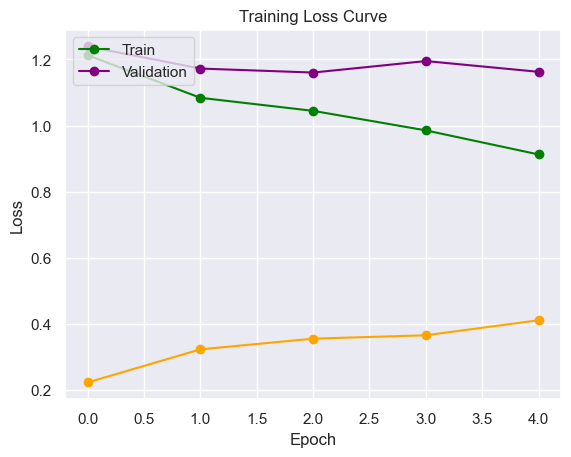

In [99]:
# Plot training loss with dots, using 'green' color
plt.plot(history.history['loss'], 'o-', label='Train Loss', color='green')

# Plot validation loss with dots, using 'purple' color
plt.plot(history.history['val_loss'], 'o-', label='Validation Loss', color='purple')
plt.plot(history.history['accuracy'], 'o-', label='Validation Loss', color='orange')

# Labeling and title
plt.ylabel("Loss")
plt.xlabel("Epoch")
plt.title("Training Loss Curve")

# Legend for the plot
plt.legend(['Train', 'Validation'], loc='upper left')

# Show the plot
plt.show()


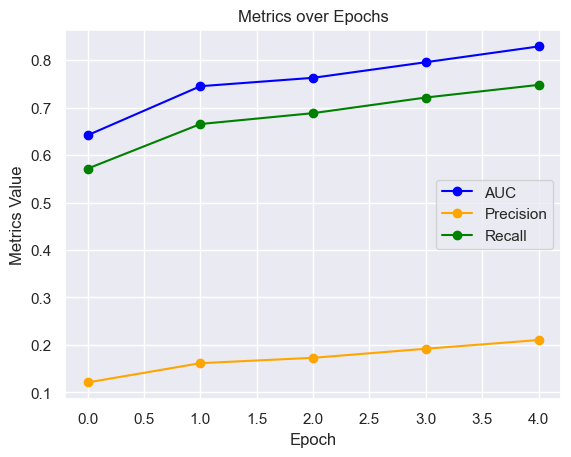

In [101]:
# Plot AUC with dots, using 'blue' color
plt.plot(history.history['auc_5'], 'o-', label='AUC', color='blue')

# Plot precision with dots, using 'orange' color
plt.plot(history.history['precision_5'], 'o-', label='Precision', color='orange')

# Plot recall with dots, using 'green' color
plt.plot(history.history['recall_5'], 'o-', label='Recall', color='green')

# Labeling and title
plt.ylabel("Metrics Value")
plt.xlabel("Epoch")
plt.title("Metrics over Epochs")

# Legend for the plot
plt.legend()

# Show the plot
plt.show()


In [51]:
from tensorflow.keras.models import load_model
model = load_model('model_wts',custom_objects={'weighted_loss':weighted_loss})

In [53]:
sample_size = min(1000, len(test))
i = rand_gen.choice(range(len(test)), sample_size, replace=False)


In [56]:
def ret_test_imgs(path_indices):
    imgs=[]
    for p in path_indices:
        arr=cv2.imread(test.loc[p]['img_path'])/255
        arr=cv2.resize(arr, dsize=(128,128))
        imgs.append(arr)
    return np.array(imgs)

In [57]:
y_preds=model.predict(ret_test_imgs(i))

21/21 [==============================] - 34s 813ms/step


In [58]:
y_vals=test[test.index.isin(i)].drop(columns=['Patient ID','img_path']).values

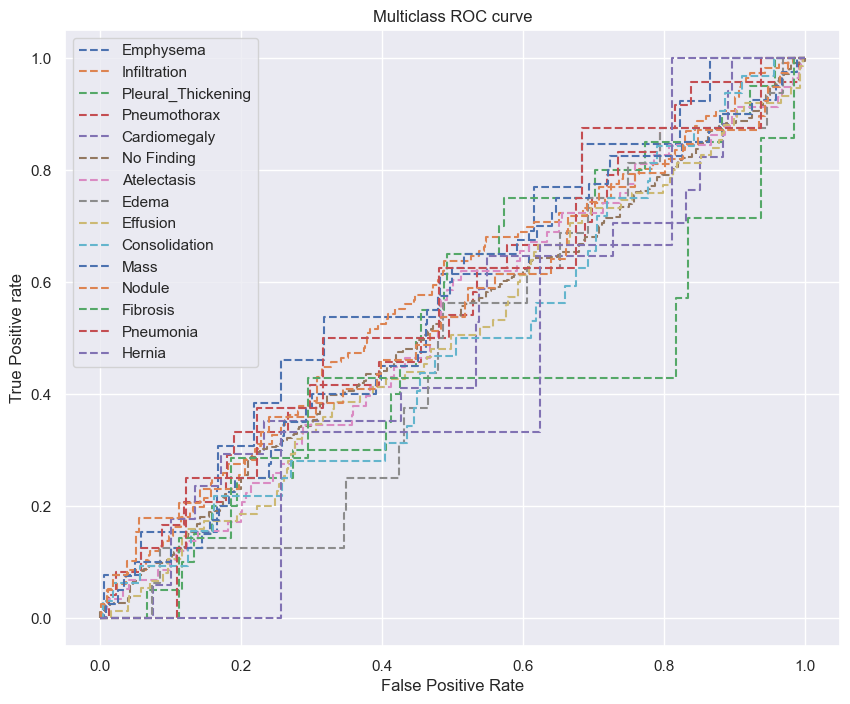

In [61]:
from sklearn.metrics import roc_curve

fpr = {}
tpr = {}
thresh ={}
for i in range(len(test.columns[2:])):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_vals[:,i], y_preds[:,i])
plt.subplots(figsize=(10,8))
for i,c in enumerate(test.columns[2:]):
    plt.plot(fpr[i], tpr[i], linestyle='--', label=f'{c}')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

In [62]:
#function to check predictions at different tresholds
def ret_tresh(tresh):
    arr=y_preds.copy()
    arr[arr>tresh]=1
    arr[arr<=tresh]=0
    return arr

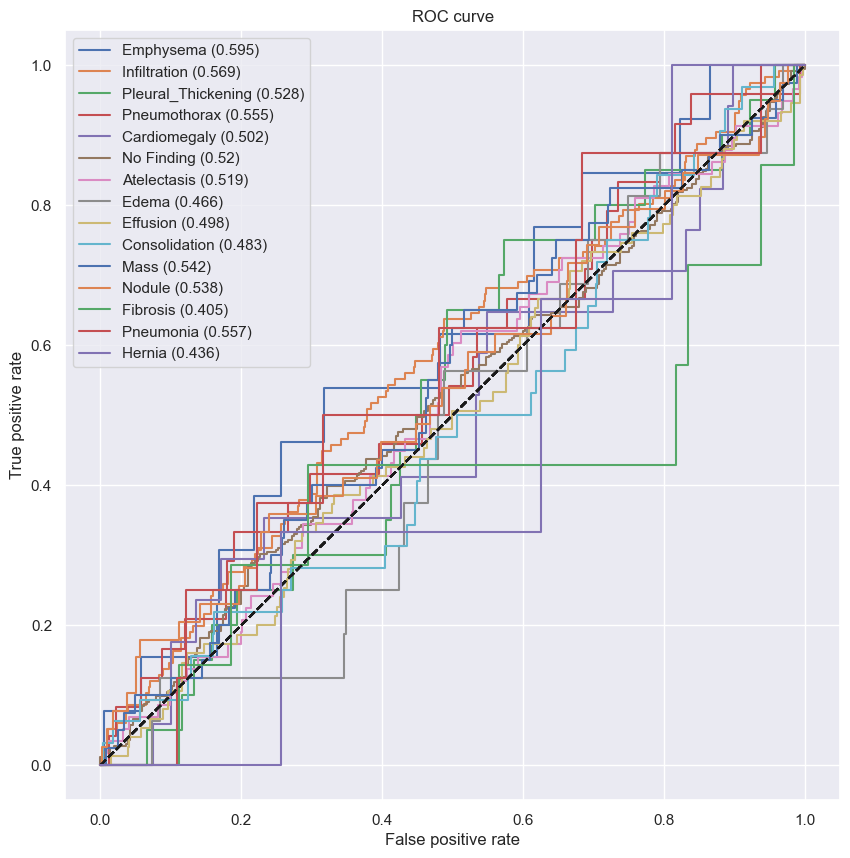

[0.5949812382739212,
 0.5692149404502088,
 0.52788906009245,
 0.5551679586563307,
 0.5015337423312883,
 0.519672131147541,
 0.5194141881596027,
 0.46573506891271055,
 0.49820426487093156,
 0.4827315541601256,
 0.5420508744038155,
 0.5375661375661377,
 0.404833836858006,
 0.5567322239031771,
 0.4359359359359359]

In [64]:
from sklearn.metrics import roc_auc_score, roc_curve

def get_roc_curve(labels, predicted_vals, real_vals):
    auc_roc_vals = []
    plt.figure(figsize=(10, 10))
    
    for i in range(len(labels)):
        try:
            gt = real_vals[:, i]
            pred = predicted_vals[:, i]
            auc_roc = roc_auc_score(gt, pred)
            auc_roc_vals.append(auc_roc)
            fpr_rf, tpr_rf, _ = roc_curve(gt, pred)
            plt.plot([0, 1], [0, 1], 'k--')
            plt.plot(fpr_rf, tpr_rf,
                     label=labels[i] + " (" + str(round(auc_roc, 3)) + ")")
        except:
            print(
                f"Error in generating ROC curve for {labels[i]}. "
                f"Dataset lacks enough examples."
            )
    
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc='best')
    plt.show()
    
    return auc_roc_vals

# Assuming y_preds and y_vals are available
get_roc_curve(test.columns[2:], y_preds, y_vals)


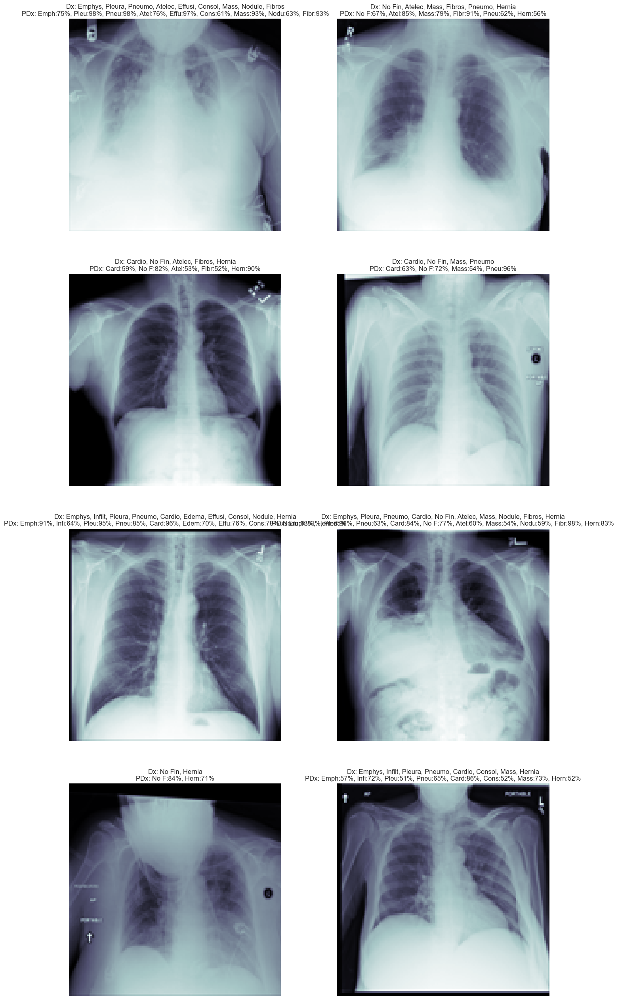

In [94]:
from PIL import Image

# Assuming 'img_path' is the column containing image paths
image_paths = test['img_path'].tolist()

# Load and resize images into a consistent shape (128, 128, 3)
images = []
for img_path in image_paths:
    img = Image.open(img_path).resize((128, 128))

    # Convert grayscale images to RGB format
    if img.mode == 'L':
        img = img.convert('RGB')

    images.append(np.array(img)[:, :, :3])

# Convert the list of images to a NumPy array
test_images = np.stack(images)



# Convert labels to a NumPy array
labels_array = np.array(labels)

# Now, you can use the following code to display the images
sickest_idx = np.argsort(np.sum(test_images, axis=(1, 2, 3)) < 1)

fig, m_axs = plt.subplots(4, 2, figsize=(16, 32))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_images[idx, :, :, 0], cmap='bone')  # Display the first channel of the image
    stat_str = [f"{n_class[:6]}" for n_class in labels_array if y_preds[idx, np.where(labels_array == n_class)[0][0]] > 0.5]
    pred_str = [f"{n_class[:4]}:{p_score * 100:.0f}%" for n_class, p_score in
                zip(labels, y_preds[idx]) if (y_preds[idx, np.where(labels_array == n_class)[0][0]] > 0.5) or (p_score > 0.5)]
    c_ax.set_title('Dx: ' + ', '.join(stat_str) + '\nPDx: ' + ', '.join(pred_str))
    c_ax.axis('off')

fig.savefig('trained_img_predictions.png')


## Apply Another Mathod

In [7]:
from itertools import chain

In [8]:

data_csv['Finding Labels'] = data_csv['Finding Labels'].map(lambda x: x.replace('No Finding', ''))

In [9]:
labels = np.unique(list(chain(*data_csv['Finding Labels'].map(lambda x: x.split('|')).tolist())))
labels = [x for x in labels if len(x) > 0]

In [10]:
labels

['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Edema',
 'Effusion',
 'Emphysema',
 'Fibrosis',
 'Hernia',
 'Infiltration',
 'Mass',
 'Nodule',
 'Pleural_Thickening',
 'Pneumonia',
 'Pneumothorax']